<h1 style="font-size:30px;">DeepLabv3+ with ResNet50_v2 Backbone</h1>

In [ ]:
!pip install -q git+https://github.com/keras-team/keras-cv.git --upgrade

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 23.0 MB/s eta 0:00:00


In [ ]:
import os
import requests
from zipfile import ZipFile
import glob
from dataclasses import dataclass, field

import random
import numpy as np
import cv2

import tensorflow as tf
import keras_cv

import matplotlib.pyplot as plt

## Gán Seeds để thực hiện các vòng lặp

In [ ]:
def system_config(SEED_VALUE):
    # Đặt hạt giống `ngẫu nhiên` của python.
    # Đặt hạt giống `numpy`
    # Đặt hạt giống `tensorflow`.
    random.seed(SEED_VALUE)
    tf.keras.utils.set_random_seed(SEED_VALUE)
    os.environ["CUDA_VISIBLE_DEVICES"] = '0'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    os.environ['TF_USE_CUDNN'] = "true"

system_config(SEED_VALUE=42)

## Tải xuống và trích xuất tập dữ liệu

In [ ]:
# Tải xuống và tập dữ liệu.
def download_and_unzip(url, save_path):

    print("Downloading and extracting assets...", end="")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)

    try:
        # Trích xuất tarfile.
        if save_path.endswith(".zip"):
            with ZipFile(save_path) as zip:
                zip.extractall(os.path.split(save_path)[0])

        print("Done")
    except:
        print("Invalid file")

In [ ]:
DATASET_URL = r"https://www.dropbox.com/scl/fi/1371bxihgw1m60b40yhlt/WF_train.zip?rlkey=no7nujiesktbh3k3q9e8hr7bf&st=zkev8ncx&dl=1"
DATASET_DIR = "WF_train"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# Tải xuống nếu tập dữ liệu không tồn tại.
if not os.path.exists(DATASET_DIR):
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH)
    os.remove(DATASET_ZIP_PATH)

## Cấu hình

### Cấu hình dữ liệu

In [ ]:
@dataclass(frozen=True)
class DatasetConfig:
    IMAGE_SIZE:        tuple = (256, 256)
    BATCH_SIZE:          int = 16
    NUM_CLASSES:         int = 2
    BRIGHTNESS_FACTOR: float = 0.2
    CONTRAST_FACTOR:   float = 0.2

### Cấu hình đào tạo

In [ ]:
@dataclass(frozen=True)
class TrainingConfig:
    MODEL:           str = "resnet50_v2_imagenet"
    EPOCHS:          int = 100
    LEARNING_RATE: float = 1e-4
    CKPT_DIR:        str = os.path.join("checkpoints",
                                        "deeplabv3_plus_"+"_".join(MODEL.split("_")[:2])+".weights.h5")
    LOGS_DIR:        str = "logs_"+"_".join(MODEL.split("_")[:2])

In [ ]:
train_config = TrainingConfig()
data_config = DatasetConfig()

## Chuẩn bị bộ dữ liệu

In [ ]:
DATASET_DIR = "WF_train"
data_images = glob.glob(os.path.join(DATASET_DIR, "Images", "*.png"))
data_masks = glob.glob(os.path.join(DATASET_DIR, "Masks", "*.png"))

# Shuffle the data paths before data preparation.
zipped_data = list(zip(data_images, data_masks))
random.shuffle(zipped_data)
data_images, data_masks = zip(*zipped_data)
data_images = list(data_images)
data_masks = list(data_masks)

In [ ]:
org_data = tf.data.Dataset.from_tensor_slices((data_images, data_masks))

### Phân tách dữ liệu đào tạo và dữ liệu kiểm định

Chúng tôi đang duy trì tỷ lệ phân chia **80-20** cho các mẫu đào tạo và xác thực.

In [ ]:
SPLIT_RATIO = 0.2
# Determine the number of validation samples
NUM_VAL = int(len(data_images) * SPLIT_RATIO)

# Split the dataset into train and validation sets
train_data = org_data.skip(NUM_VAL)
valid_data = org_data.take(NUM_VAL)

In [ ]:
print(f"Train samples: {train_data.cardinality().numpy()}")
print(f"Validation samples: {valid_data.cardinality().numpy()}")

Train samples: 869
Validation samples: 217


### Tải dữ liệu và ngưỡng mặt nạ

In [ ]:
def read_image_mask(image_path, mask=False, size = data_config.IMAGE_SIZE):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_jpeg(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=size, method = "bicubic")

        image_mask = tf.zeros_like(image)
        cond = image >=1
        updates = tf.ones_like(image[cond])
        image_mask = tf.tensor_scatter_nd_update(image_mask, tf.where(cond), updates)
        image = tf.cast(image_mask, tf.uint8)

    else:
        image = tf.image.decode_jpeg(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=size, method = "bicubic")
        image = tf.cast(tf.clip_by_value(image, 0., 255.), tf.float32)

    return image

In [ ]:
def load_data(image_list, mask_list):
    image = read_image_mask(image_list)
    mask  = read_image_mask(mask_list, mask=True)
    return {"images":image, "segmentation_masks":mask}

In [ ]:
train_ds = train_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
valid_ds = valid_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)

### Giải nén hình ảnh và mặt nạ phân đoạn

`unpackage_inputs` là một hàm tiện ích được sử dụng để giải nén các đầu vào từ
định dạng từ điển thành một bộ `(images, segmentation_masks)`. Hàm này sẽ được sử dụng sau
để trực quan hóa hình ảnh và mặt nạ phân đoạn cũng như các dự đoán của mô hình.

In [ ]:
def unpackage_inputs(inputs):
    images = inputs["images"]
    segmentation_masks = inputs["segmentation_masks"]
    return images, segmentation_masks

## Hình ảnh thực tế

In [ ]:
# Từ điển ánh xạ ID lớp thành màu sắc.
id2color = {
    0: (0,  0,    0),    # Background
    1: (102, 204, 255),  # Waterbody
 }

In [ ]:
# Chức năng chuyển đổi biểu diễn mặt nạ kênh đơn thành mặt nạ RGB.
def num_to_rgb(num_arr, color_map=id2color):

    # lớp_đơn = np.squeeze(số_mảng)
    output = np.zeros(num_arr.shape[:2]+(3,))

    for k in color_map.keys():
        output[num_arr==k] = color_map[k]

    return output.astype(np.uint8)

In [ ]:
# Chức năng phủ một bản đồ phân đoạn lên trên một hình ảnh RGB.
def image_overlay(image, segmented_image):

    alpha = 1.0 # Độ trong suốt cho hình ảnh gốc.
    beta  = 0.7 # Độ trong suốt cho bản đồ phân đoạn.
    gamma = 0.0 # Số vô hướng được thêm vào mỗi tổng.

    image = image.astype(np.uint8)

    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)

    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    return image

Chúng ta hãy hiển thị một vài hình ảnh thực tế cùng với mặt nạ thực tế tương ứng; và phủ lên hình ảnh đầu vào.

In [ ]:
def display_image_and_mask(data_list, title_list, figsize, color_mask=False, color_map=id2color):

    # Tạo bản đồ phân đoạn RGB từ bản đồ phân đoạn thang độ xám.
    rgb_gt_mask = num_to_rgb(data_list[1], color_map=color_map)
    mask_to_overlay = rgb_gt_mask

    if len(data_list)==3:
        rgb_pred_mask = num_to_rgb(data_list[-1], color_map=color_map)
        mask_to_overlay = rgb_pred_mask

    # Tạo hình ảnh chồng lên nhau.
    overlayed_image = image_overlay(data_list[0], mask_to_overlay)

    data_list.append(overlayed_image)

    fig, axes = plt.subplots(nrows=1, ncols=len(data_list), figsize=figsize)

    for idx, axis in enumerate(axes.flat):
        axis.set_title(title_list[idx])
        if title_list[idx] == "GT Mask":
            if color_mask:
                axis.imshow(rgb_gt_mask)
            else:
                axis.imshow(data_list[1], cmap="gray")

        elif title_list[idx] == "Pred Mask":
            if color_mask:
                axis.imshow(rgb_pred_mask)
            else:
                axis.imshow(data_list[-1], cmap="gray")

        else:
            axis.imshow(data_list[idx])

        axis.axis('off')

    plt.show()

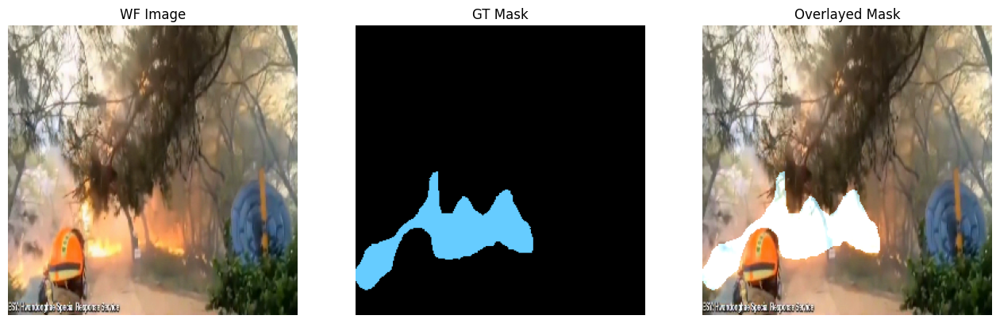

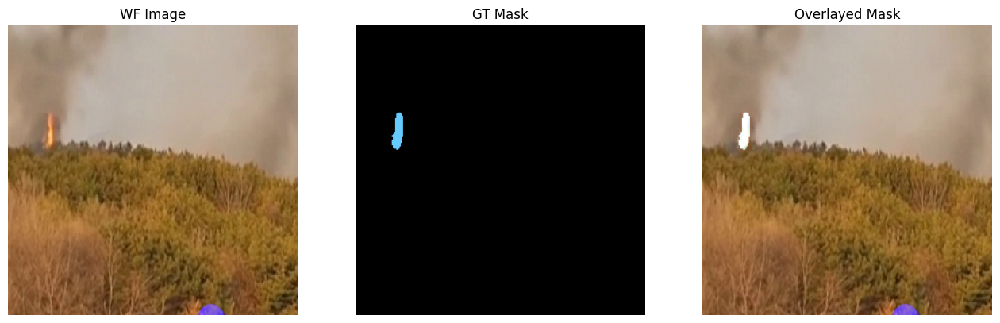

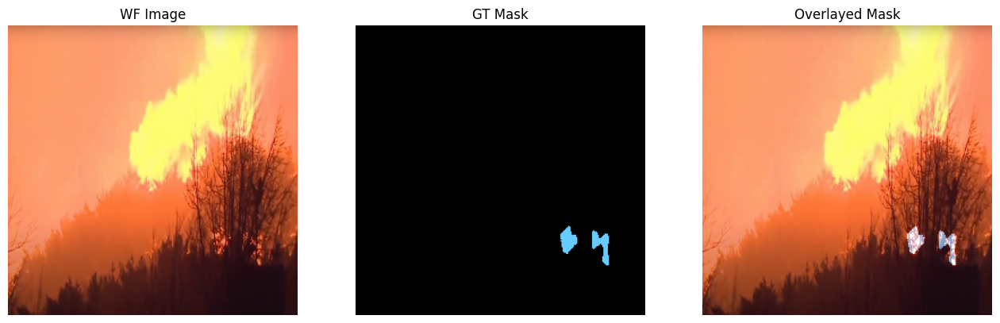

In [ ]:
plot_train_ds = train_ds.map(unpackage_inputs).batch(3)
image_batch, mask_batch = next(iter(plot_train_ds.take(1)))

titles = ["WF Image", "GT Mask", "Overlayed Mask"]

for image, gt_mask in zip(image_batch, mask_batch):

    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask],
                           title_list=titles,
                           figsize=(16,6),
                           color_mask=True)

## Tăng cường dữ liệu

Chúng tôi sẽ sử dụng các phép biến đổi sau đây làm phép tăng cường:
* RandomFlip (chế độ mặc định là **"ngang"**, với xác suất là `0,5`)
* Độ sáng ngẫu nhiên
* Độ tương phản ngẫu nhiên

In [ ]:
augment_fn = tf.keras.Sequential(
    [
        keras_cv.layers.RandomFlip(),
        keras_cv.layers.RandomBrightness(factor=data_config.BRIGHTNESS_FACTOR,
                                         value_range=(0, 255)),
        keras_cv.layers.RandomContrast(factor=data_config.CONTRAST_FACTOR,
                                       value_range=(0, 255)),
    ]
)

In [ ]:
train_dataset = (
                train_ds.shuffle(data_config.BATCH_SIZE)
                .map(augment_fn, num_parallel_calls=tf.data.AUTOTUNE)
                .batch(data_config.BATCH_SIZE)
                .map(unpackage_inputs)
                .prefetch(buffer_size=tf.data.AUTOTUNE)
)

valid_dataset = (
                valid_ds.batch(data_config.BATCH_SIZE)
                .map(unpackage_inputs)
                .prefetch(buffer_size=tf.data.AUTOTUNE)
)

Chúng ta hãy hình dung một vài hình ảnh và mặt nạ phân đoạn của chúng từ dữ liệu đào tạo, với
 `keras_cv.visualization.plot_segmentation_mask_gallery` API.

### Hiển thị dữ liệu tăng cường

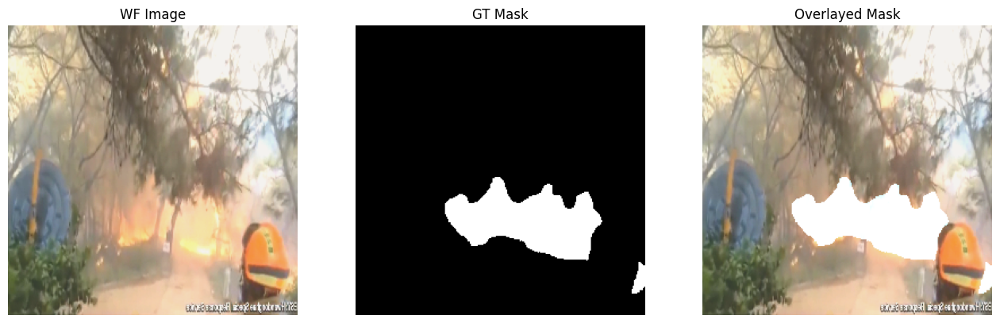

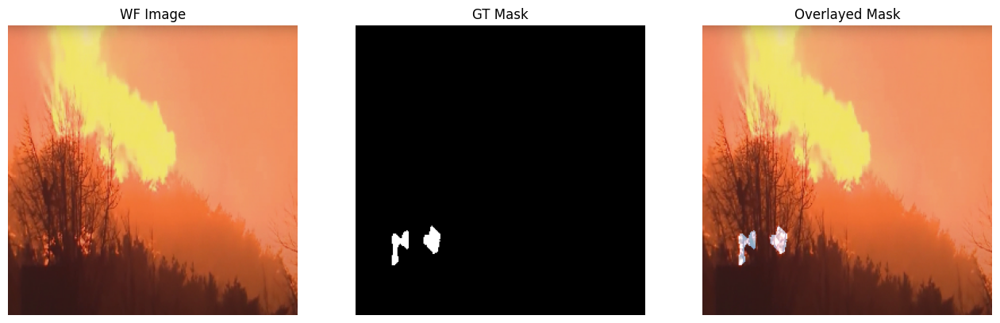

In [ ]:
image_batch, aug_mask_batch = next(iter(train_dataset.take(1)))

titles = ["WF Image", "GT Mask", "Overlayed Mask"]

for idx, (image, gt_mask) in enumerate(zip(image_batch, aug_mask_batch)):
    if idx > 1:
        break
    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask],
                           title_list=titles,
                           figsize=(16,6),
                           color_mask=False)

## Cấu hình mô hình

Chúng tôi sẽ sử dụng trình trích xuất tính năng `resnet50_v2_imagenet` trên DeepLabv3 Head.

In [ ]:
backbone = keras_cv.models.ResNet50V2Backbone.from_preset(preset = train_config.MODEL,
                                                          input_shape=data_config.IMAGE_SIZE+(3,),
                                                          load_weights = True)
model = keras_cv.models.segmentation.DeepLabV3Plus(
        num_classes=data_config.NUM_CLASSES, backbone=backbone,
    )
print(model.summary())

100%|██████████| 886/886 [00:00<00:00, 597kB/s]


100%|██████████| 90.3M/90.3M [00:07<00:00, 13.3MB/s]


Model: "deep_lab_v3_plus"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ functional (Functional)   │ [(None, 64, 64, 256),  │     23,556,608 │ input_layer[0][0]      │
│                           │ (None, 8, 8, 2048)]    │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ spatial_pyramid_pooling   │ (None, 8, 8, 256)      │     15,538,176 │ functional[0][1]       │
│ (SpatialPyramidPooling)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ encoder_output_upsampling │ (None, 64, 64, 256)    │              0 │ spatial_pyramid_pooli… │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_7 (Sequential) │ (None, 64, 64, 48)     │         12,480 │ functional[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 64, 64, 304)    │              0 │ encoder_output_upsamp… │
│                           │                        │                │ sequential_7[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_8 (Sequential) │ (None, 256, 256, 2)    │         79,360 │ concatenate[0][0]      │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 39,186,624 (149.49 MB)

 Trainable params: 39,141,600 (149.31 MB)

 Non-trainable params: 45,024 (175.88 KB)

None


## Số liệu đánh giá

Giao điểm trên hợp nhất (IoU) là một số liệu thường được sử dụng trong các bài toán phân đoạn để đánh giá độ chính xác của mô hình. Nó cung cấp một cơ sở trực quan hơn cho độ chính xác mà không bị ảnh hưởng bởi tỷ lệ phần trăm (không cân bằng) của các pixel từ bất kỳ lớp cụ thể nào. Với hai mặt nạ phân đoạn, `A` và `B`, IoU được định nghĩa như sau::

$$
IoU = \frac{|A\cap B\hspace{1mm}|}{|A\cup B\hspace{1mm}|} \hspace{2mm}
$$

Khi có nhiều lớp và suy luận, chúng tôi đánh giá hiệu suất của mô hình bằng cách tính IoU trung bình.

Hàm bên dưới tính toán IoU trung bình chỉ xem xét các lớp có trong mặt nạ thực tế hoặc bản đồ phân đoạn dự đoán (đôi khi được gọi là IoU trung bình theo lớp). Phép tính này là biểu diễn tốt hơn của số liệu vì nó chỉ xem xét các lớp có liên quan. **Đây là phép tính số liệu mà chúng tôi sử dụng cho IoU trung bình.**mean IoU.**

In [ ]:
def mean_iou(y_true, y_pred):

    # Lấy tổng số lớp từ đầu ra của mô hình.
    num_classes = y_pred.shape[-1]

    y_true = tf.squeeze(y_true, axis=-1)

    y_true = tf.one_hot(tf.cast(y_true, tf.int32), num_classes, axis=-1)
    y_pred = tf.one_hot(tf.math.argmax(y_pred, axis=-1), num_classes, axis=-1)

    # Giao điểm: |G ∩ P|. Hình dạng: (batch_size, num_classes)
    intersection = tf.math.reduce_sum(y_true * y_pred, axis=(1, 2))

    # Tổng cộng: |G| + |P|. Hình dạng: (batch_size, num_classes)
    total = tf.math.reduce_sum(y_true, axis=(1, 2)) + tf.math.reduce_sum(y_pred, axis=(1, 2))

    union = total - intersection

    is_class_present =  tf.cast(tf.math.not_equal(total, 0), dtype=tf.float32)
    num_classes_present = tf.math.reduce_sum(is_class_present, axis=1)

    iou = tf.math.divide_no_nan(intersection, union)
    iou = tf.math.reduce_sum(iou, axis=1) / num_classes_present

    # Tính giá trị trung bình trên trục lô. Hình dạng: Vô hướng
    mean_iou = tf.math.reduce_mean(iou)

    return mean_iou

### Tensorboard và ModelCheckpoint Callbacks

In [ ]:
def get_callbacks(
    train_config,
    monitor="val_mean_iou",
    mode="max",
    save_weights_only=True,
    save_best_only=True,
):

    # Khởi tạo lệnh gọi lại tensorboard để ghi nhật ký.
    tensorboard_callback = tf.keras.callbacks.TensorBoard(
        log_dir=train_config.LOGS_DIR,
        histogram_freq=20,
        write_graph=False,
        update_freq="epoch",
    )


    # Cập nhật đường dẫn tệp nếu lưu trọng số mô hình tốt nhất.
    if save_weights_only:
        checkpoint_filepath = train_config.CKPT_DIR

    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_filepath,
        save_weights_only=save_weights_only,
        monitor=monitor,
        mode=mode,
        save_best_only=save_best_only,
        verbose=1,
    )

    return [tensorboard_callback, model_checkpoint_callback]

## Đào tạo mô hình
Bây giờ chúng ta hãy tạo mô hình, biên dịch và đào tạo bằng cách gọi `model.fit()` sử dụng các cấu hình được xác định trong lớp `Trainingconfig`.

In [ ]:
# Xây dựng mô hình.

# Get callbacks.
callbacks = get_callbacks(train_config)
# Define Loss.
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
# Compile model.
model.compile(
    optimizer=tf.keras.optimizers.Adam(train_config.LEARNING_RATE),
    loss=loss_fn,
    metrics=["accuracy", mean_iou],
)

In [ ]:
# Đào tạo mô hình, thực hiện xác thực vào cuối mỗi kỷ nguyên.
history = model.fit(
    train_dataset,
    epochs=train_config.EPOCHS,
    validation_data=valid_dataset,
    callbacks=callbacks
)

Epoch 1/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6593 - loss: 0.7122 - mean_iou: 0.4171
Epoch 1: val_mean_iou improved from -inf to 0.54851, saving model to checkpoints/deeplabv3_plus_resnet50_v2.weights.h5
55/55 ━━━━━━━━━━━━━━━━━━━━ 148s 2s/step - accuracy: 0.6622 - loss: 0.7077 - mean_iou: 0.4195 - val_accuracy: 0.8508 - val_loss: 0.4491 - val_mean_iou: 0.5485
Epoch 2/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9548 - loss: 0.1629 - mean_iou: 0.6872
Epoch 2: val_mean_iou improved from 0.54851 to 0.56333, saving model to checkpoints/deeplabv3_plus_resnet50_v2.weights.h5
55/55 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - accuracy: 0.9549 - loss: 0.1626 - mean_iou: 0.6873 - val_accuracy: 0.8552 - val_loss: 0.4332 - val_mean_iou: 0.5633
Epoch 3/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9616 - loss: 0.1185 - mean_iou: 0.7186
Epoch 3: val_mean_iou improved from 0.56333 to 0.58266, saving model to checkpoints/deeplabv3_plus_resnet50_v2.weights.h5
55/55 ━━━━━━

#### Tải mô hình được tinh chỉnh

In [ ]:
model.load_weights(train_config.CKPT_DIR)

#### Đánh giá việc đào tạo

In [ ]:
evaluate = model.evaluate(valid_dataset)

14/14 ━━━━━━━━━━━━━━━━━━━━ 7s 452ms/step - accuracy: 0.9761 - loss: 0.0891 - mean_iou: 0.8541


In [ ]:
# Tải xuống và tập dữ liệu.
def download_and_unzip(url, save_path):

    print("Downloading and extracting assets...", end="")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)

    try:
        # Trích xuất tarfile.
        if save_path.endswith(".zip"):
            with ZipFile(save_path) as zip:
                zip.extractall(os.path.split(save_path)[0])

        print("Done")
    except:
        print("Invalid file")

In [ ]:
DATASET_URL = r"https://www.dropbox.com/scl/fi/mkok5n9vvzwcfk8l7nojl/WF_test.zip?rlkey=5o4py3jsehnsuhebozcd4k9dn&st=bnbgoex7&dl=1"
DATASET_DIR = "WF_test"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")

# Tải xuống nếu tập dữ liệu không tồn tại.
if not os.path.exists(DATASET_DIR):
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH)
    os.remove(DATASET_ZIP_PATH)

In [ ]:
DATASET_DIR = "WF_test"
data_images = glob.glob(os.path.join(DATASET_DIR, "Images", "*.png"))
data_masks = glob.glob(os.path.join(DATASET_DIR, "Masks", "*.png"))

# Xáo trộn các đường dẫn dữ liệu trước khi chuẩn bị dữ liệu.
zipped_data = list(zip(data_images, data_masks))
random.shuffle(zipped_data)
data_images, data_masks = zip(*zipped_data)
data_images = list(data_images)
data_masks = list(data_masks)

In [ ]:
org_data = tf.data.Dataset.from_tensor_slices((data_images, data_masks))

Train-Validation Split

In [ ]:
SPLIT_RATIO = 1
# Xác định số lượng mẫu xác nhận
NUM_VAL = int(len(data_images) * SPLIT_RATIO)

# Chia tập dữ liệu thành các tập huấn luyện và xác thực
train_data = org_data.take(NUM_VAL)
valid_data = org_data.take(NUM_VAL)

In [ ]:
print(f"Train samples: {train_data.cardinality().numpy()}")
print(f"Validation samples: {valid_data.cardinality().numpy()}")

Train samples: 36
Validation samples: 36


Tải dữ liệu và ngưỡng mặt nạ

In [ ]:
def read_image_mask(image_path, mask=False, size = data_config.IMAGE_SIZE):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_jpeg(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=size, method = "bicubic")

        image_mask = tf.zeros_like(image)
        cond = image >=1
        updates = tf.ones_like(image[cond])
        image_mask = tf.tensor_scatter_nd_update(image_mask, tf.where(cond), updates)
        image = tf.cast(image_mask, tf.uint8)

    else:
        image = tf.image.decode_jpeg(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=size, method = "bicubic")
        image = tf.cast(tf.clip_by_value(image, 0., 255.), tf.float32)

    return image

In [ ]:
def load_data(image_list, mask_list):
    image = read_image_mask(image_list)
    mask  = read_image_mask(mask_list, mask=True)
    return {"images":image, "segmentation_masks":mask}

In [ ]:
train_ds = train_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
valid_ds = valid_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)

Giải nén hình ảnh và mặt nạ phân đoạn

In [ ]:
def unpackage_inputs(inputs):
    images = inputs["images"]
    segmentation_masks = inputs["segmentation_masks"]
    return images, segmentation_masks

Hình ảnh thực tế

In [ ]:
#Từ điển ánh xạ ID lớp thành màu sắc.
id2color = {
    0: (0,  0,    0),    # Background
    1: (102, 204, 255),  # wildfire
 }

In [ ]:
# Chức năng chuyển đổi biểu diễn mặt nạ kênh đơn sang mặt nạ RGB.
def num_to_rgb(num_arr, color_map=id2color):

    # lớp_đơn = np.squeeze(số_mảng)
    output = np.zeros(num_arr.shape[:2]+(3,))

    for k in color_map.keys():
        output[num_arr==k] = color_map[k]

    return output.astype(np.uint8)

In [ ]:
# Chức năng phủ bản đồ phân đoạn lên trên ảnh RGB.
def image_overlay(image, segmented_image):

    alpha = 1.0 # Độ trong suốt của hình ảnh gốc.
    beta  = 0.7 # Tính minh bạch cho bản đồ phân đoạn.
    gamma = 0.0 # Số vô hướng được thêm vào mỗi tổng.

    image = image.astype(np.uint8)

    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)

    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    return image

Chúng ta hãy hiển thị một vài hình ảnh thực tế cùng với mặt nạ thực tế tương ứng; và phủ lên hình ảnh đầu vào.

In [ ]:
def display_image_and_mask(data_list, title_list, figsize, color_mask=False, color_map=id2color):

    # Tạo bản đồ phân đoạn RGB từ bản đồ phân đoạn thang độ xám.
    rgb_gt_mask = num_to_rgb(data_list[1], color_map=color_map)
    mask_to_overlay = rgb_gt_mask

    if len(data_list)==3:
        rgb_pred_mask = num_to_rgb(data_list[-1], color_map=color_map)
        mask_to_overlay = rgb_pred_mask

    # Tạo hình ảnh chồng lên nhau.
    overlayed_image = image_overlay(data_list[0], mask_to_overlay)

    data_list.append(overlayed_image)

    fig, axes = plt.subplots(nrows=1, ncols=len(data_list), figsize=figsize)

    for idx, axis in enumerate(axes.flat):
        axis.set_title(title_list[idx])
        if title_list[idx] == "GT Mask":
            if color_mask:
                axis.imshow(rgb_gt_mask)
            else:
                axis.imshow(data_list[1], cmap="gray")

        elif title_list[idx] == "Pred Mask":
            if color_mask:
                axis.imshow(rgb_pred_mask)
            else:
                axis.imshow(data_list[-1], cmap="gray")

        else:
            axis.imshow(data_list[idx])

        axis.axis('off')

    plt.show()

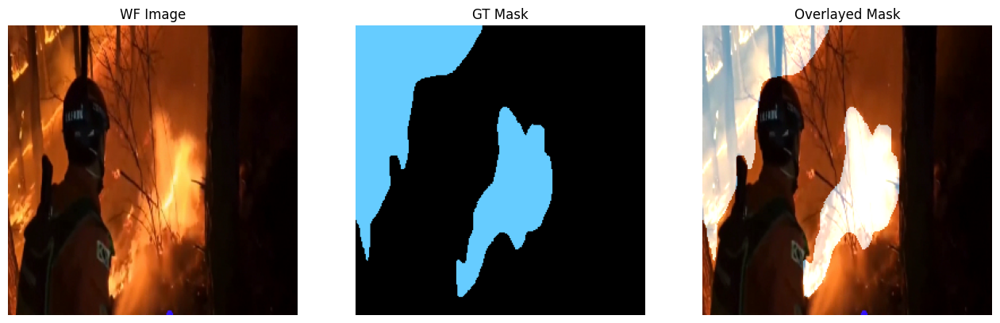

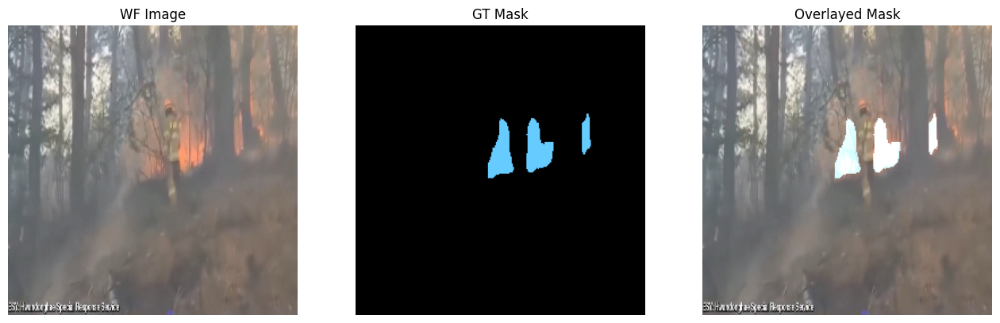

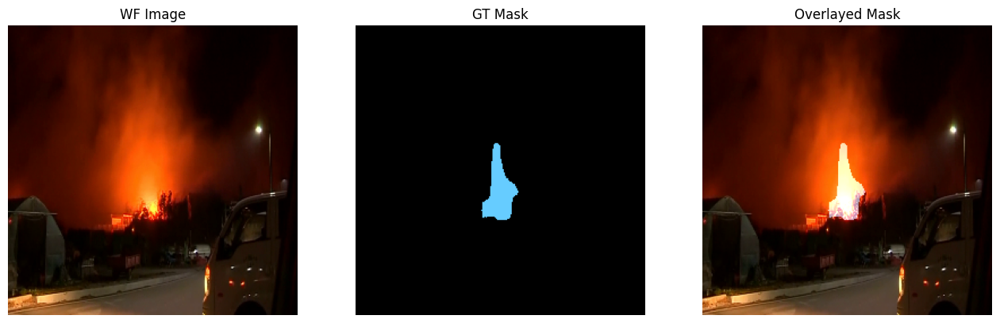

In [ ]:
plot_train_ds = train_ds.map(unpackage_inputs).batch(3)
image_batch, mask_batch = next(iter(plot_train_ds.take(1)))

titles = ["WF Image", "GT Mask", "Overlayed Mask"]

for image, gt_mask in zip(image_batch, mask_batch):

    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask],
                           title_list=titles,
                           figsize=(16,6),
                           color_mask=True)

Tăng cường dữ liệu Chúng tôi sẽ sử dụng các phép biến đổi sau đây làm phép tăng cường:

RandomFlip (chế độ mặc định là "ngang", với xác suất là 0,5) Độ sáng ngẫu nhiên Độ tương phản ngẫu nhiên

In [ ]:
augment_fn = tf.keras.Sequential(
    [
        keras_cv.layers.RandomFlip(),
        keras_cv.layers.RandomBrightness(factor=data_config.BRIGHTNESS_FACTOR,
                                         value_range=(0, 255)),
        keras_cv.layers.RandomContrast(factor=data_config.CONTRAST_FACTOR,
                                       value_range=(0, 255)),
    ]
)

In [ ]:
train_dataset = (
                train_ds.shuffle(data_config.BATCH_SIZE)
                .map(augment_fn, num_parallel_calls=tf.data.AUTOTUNE)
                .batch(data_config.BATCH_SIZE)
                .map(unpackage_inputs)
                .prefetch(buffer_size=tf.data.AUTOTUNE)
)

valid_dataset = (
                valid_ds.batch(data_config.BATCH_SIZE)
                .map(unpackage_inputs)
                .prefetch(buffer_size=tf.data.AUTOTUNE)
)

Hình dung dữ liệu tăng cường

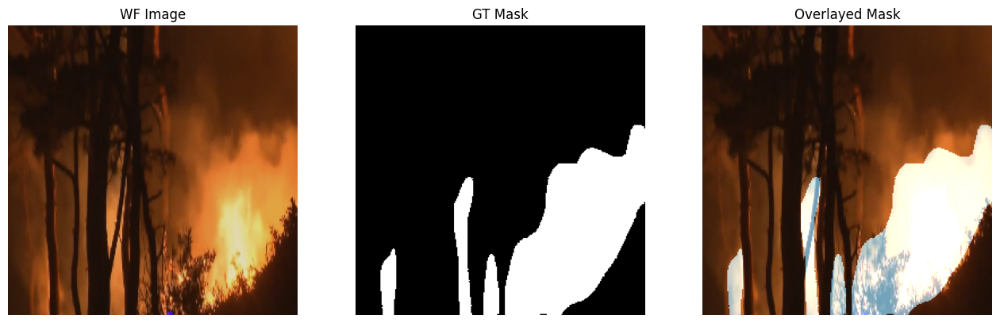

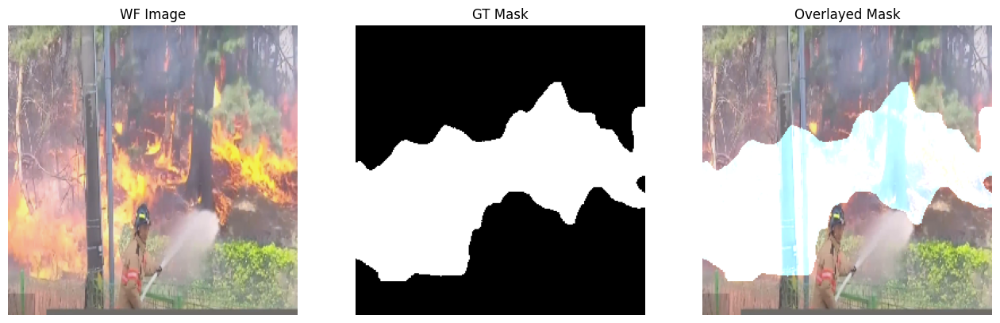

In [ ]:
image_batch, aug_mask_batch = next(iter(train_dataset.take(1)))

titles = ["WF Image", "GT Mask", "Overlayed Mask"]

for idx, (image, gt_mask) in enumerate(zip(image_batch, aug_mask_batch)):
    if idx > 1:
        break
    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask],
                           title_list=titles,
                           figsize=(16,6),
                           color_mask=False)

Tải trọng lượng mô hình được tinh chỉnh

In [ ]:
model.load_weights(train_config.CKPT_DIR)

#Dự đoán bằng Mô hình được điều chỉnh chính xác
##Bây giờ quá trình đào tạo mô hình của DeepLabv3 đã hoàn tất, chúng ta hãy thử nghiệm nó bằng cách đưa ra dự đoán trên một vài hình ảnh mẫu.

In [ ]:
def inference(model, dataset, samples_to_plot):

    num_batches_to_process = 1
    count = 0
    stop_plot = False

    titles = ["WF Image", "GT Mask", "Pred Mask", "Overlayed Prediction"]

    for idx, data in enumerate(dataset):

        if stop_plot:
            break

        batch_img, batch_mask = data[0], data[1]
        batch_pred = (model.predict(batch_img)).astype('float32')
        batch_pred = batch_pred.argmax(axis=-1)

        batch_img  = batch_img.numpy().astype('uint8')
        batch_mask = batch_mask.numpy().squeeze(axis=-1)

        for image, mask, pred in zip(batch_img, batch_mask, batch_pred):
            count+=1
            display_image_and_mask([image, mask, pred],
                                  title_list=titles,
                                   figsize=(20,8),
                                   color_mask=True)
            if count >= samples_to_plot:
                stop_plot=True
                break


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


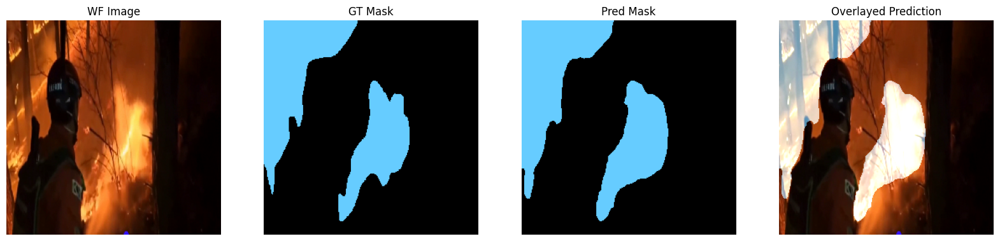

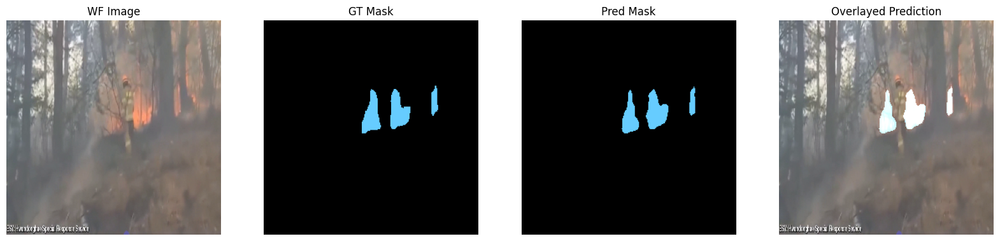

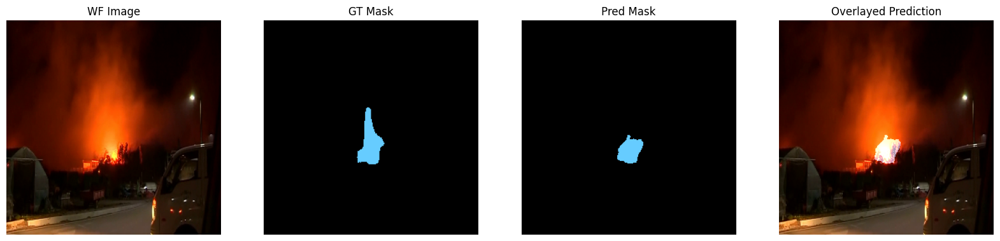

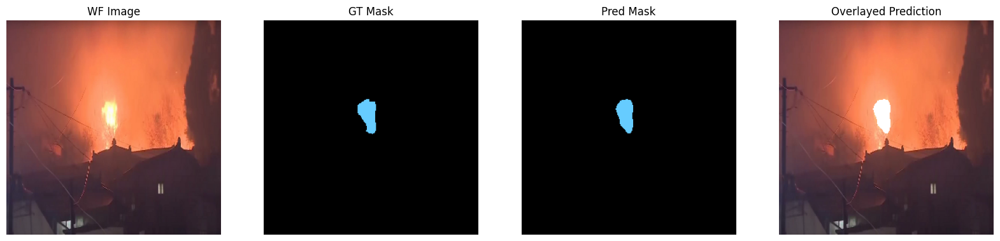

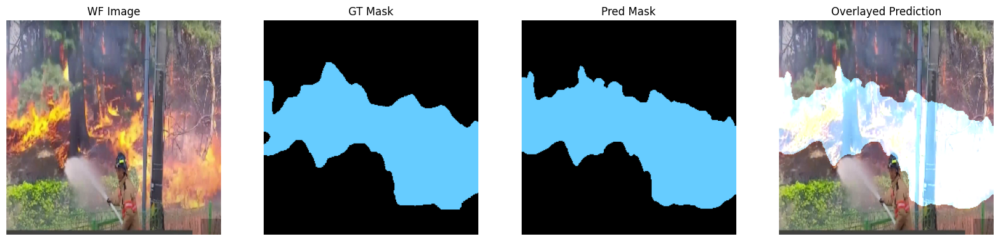

...

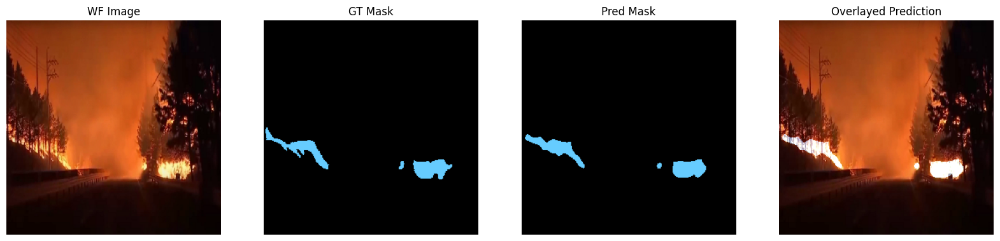

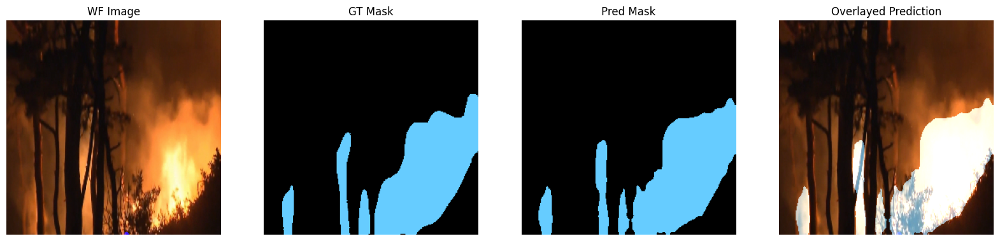

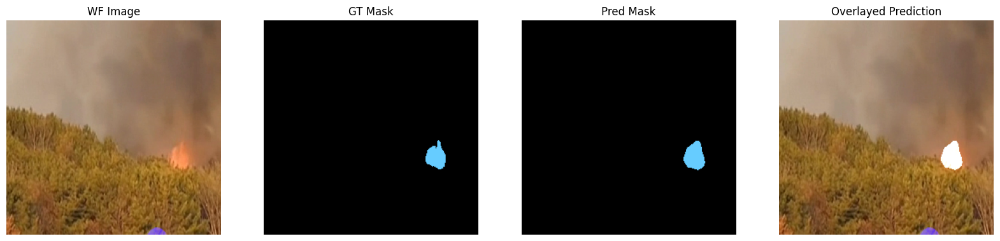

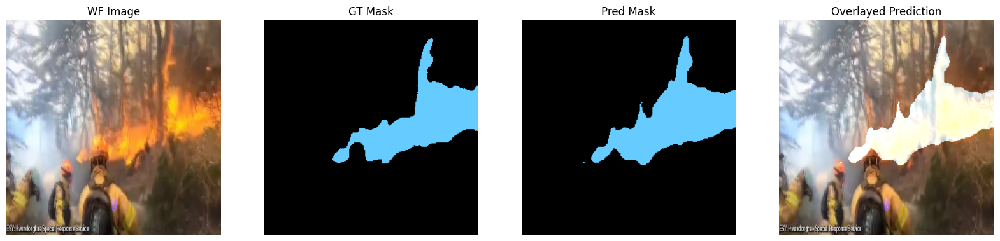

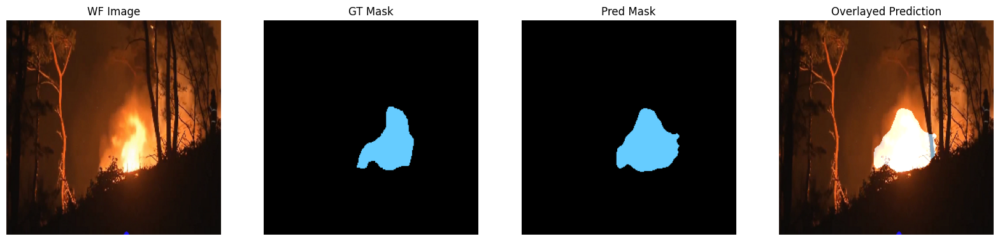

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


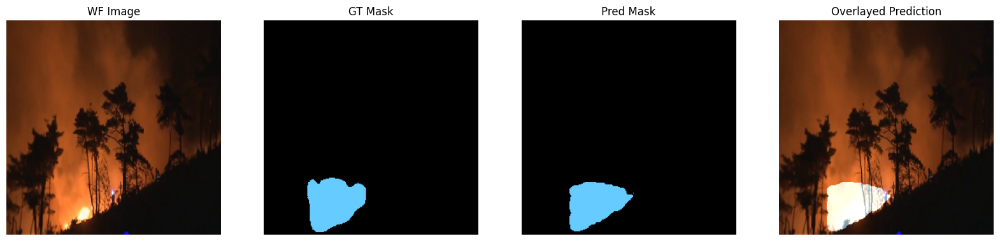

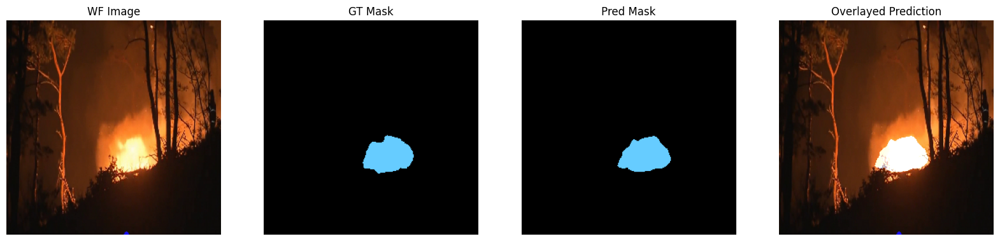

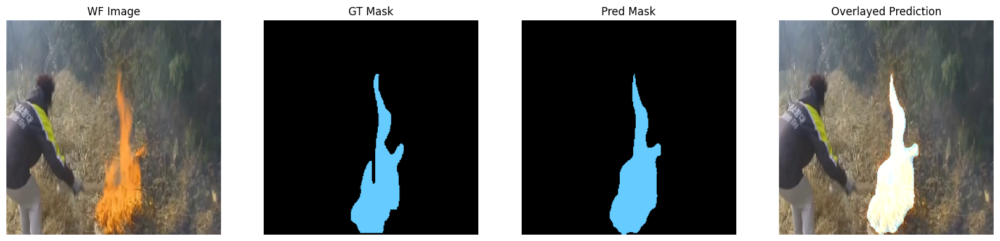

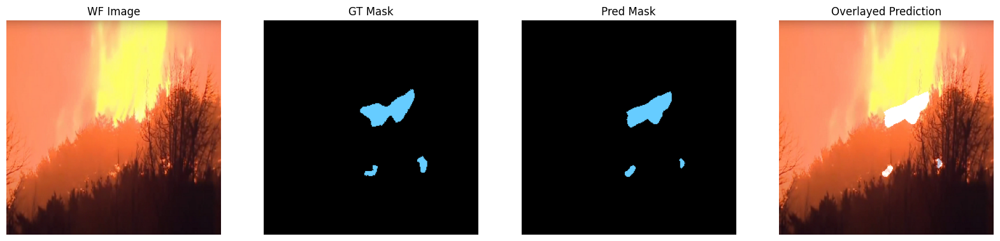

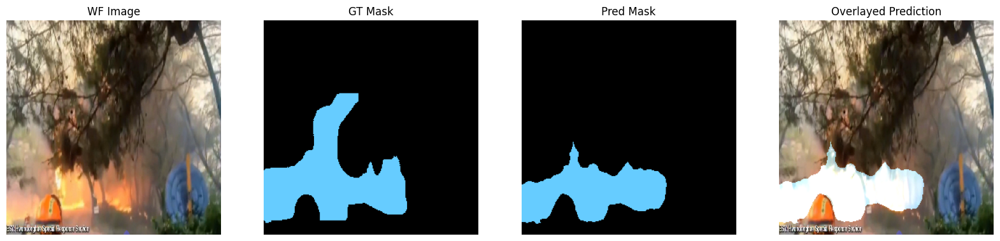

...

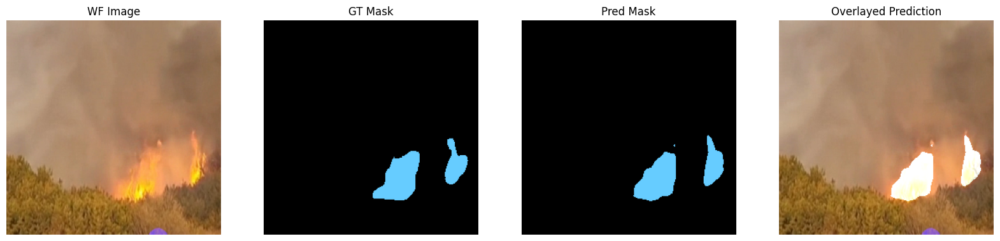

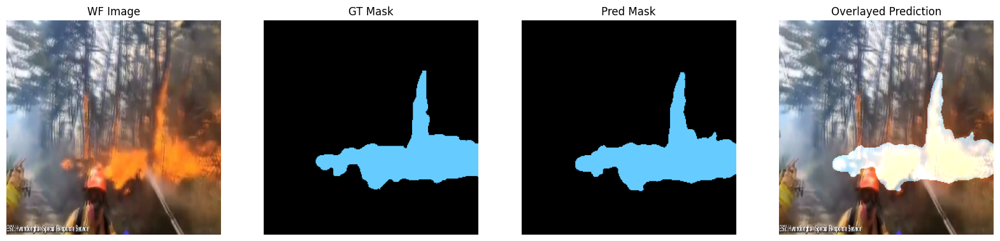

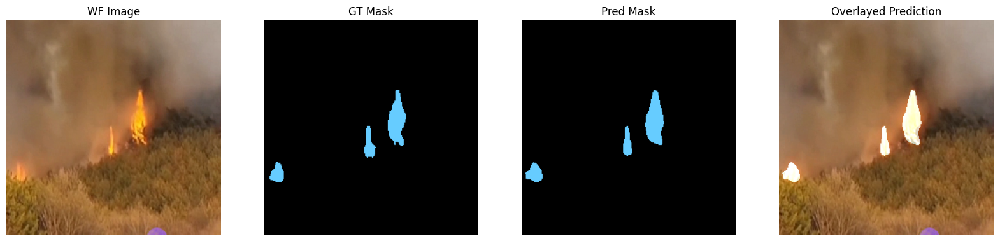

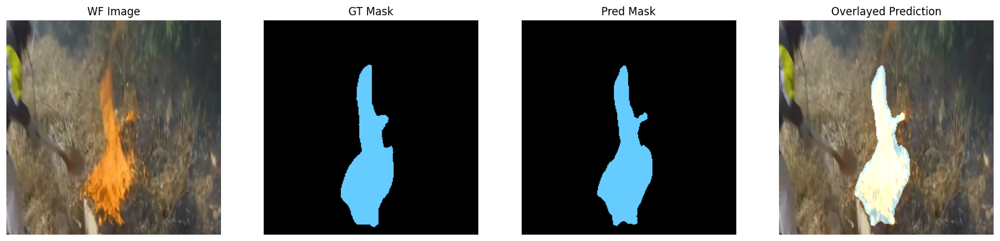

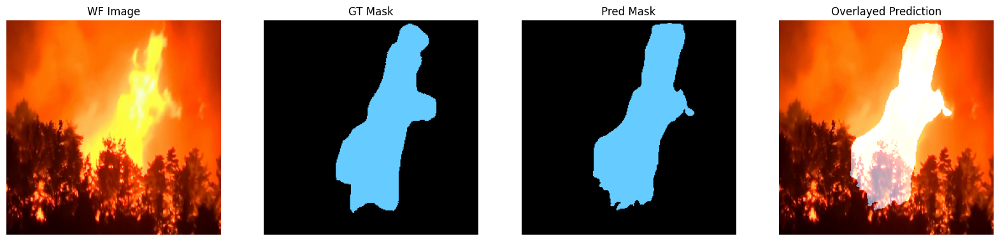

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


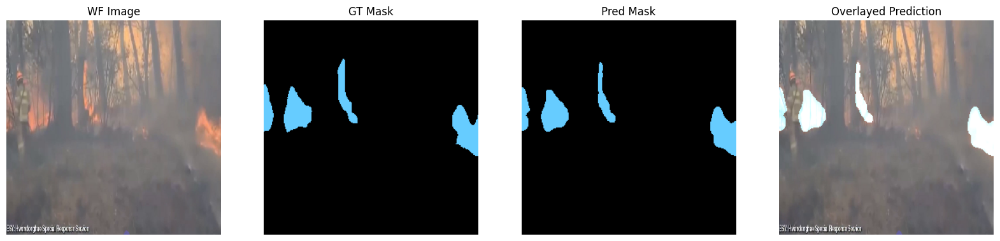

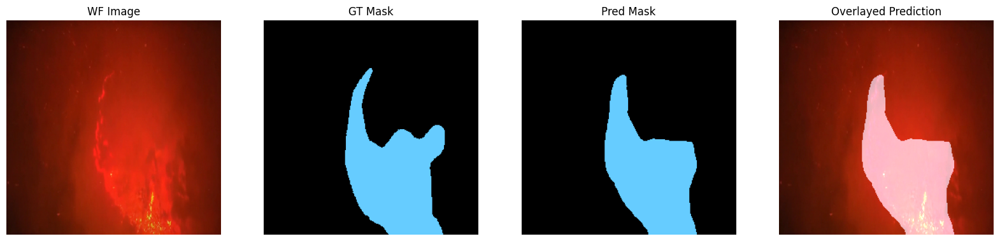

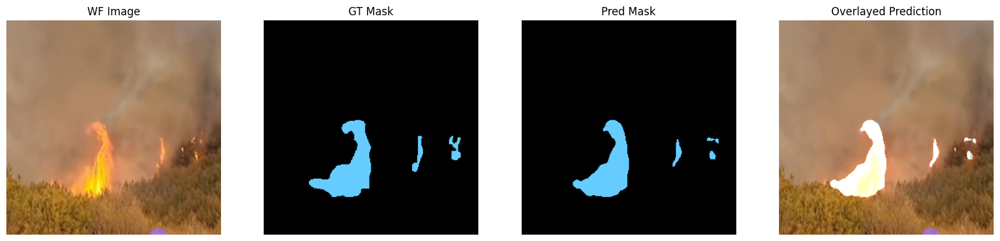

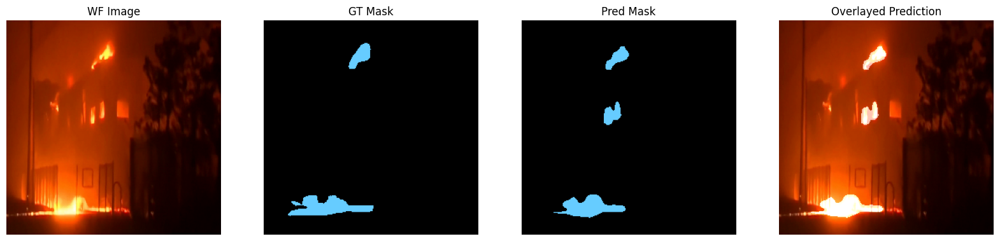

In [ ]:
inference(model, valid_dataset, samples_to_plot=36)
# Lưu cốt truyện vào một tập tin
#fig.savefig('wildfire_plot_100epoch.png')  # Save as PNG file

# Đóng hình sau khi lưu
#plt.close(fig)